In [ ]:
#Group members:
#Margot Brady, Teagan Ryan, Sophia Zhang, and Josh Kwan

Written explanation:

Extraction - As the sources come from .XLSX files (excel), the first step is to convert the files to .CSV files for transformation and structuring. Using Microsoft Excel, the files can be saved as CSV files to format the data in an interpretable manner. Once the files are downloaded, a data frame can be created using pandas and calling the read_csv function on the appropriate file.

Transformation - To process the data from the two sources, the first three rows need to be skipped as they contain background information on the source. For the unemployment source, only the following year 2021 is needed to be considered where a list of the necessary columns would be obtained to modify the original dataset. These columns would be: "FIPS_Code", "State","Area_Name","Unemployed_2021", "Unemployment_rate_2021", "Median_Household_Income_2021","Med_HH_Income_Percent_of_State_Total_2021". For the education source, the same is as follows where only the following years of 2018 to 2022 are needed to be considered where another list of necessary columns would be obtained to modify the original dataset. The following columns would be:"FIPS Code","State","Area name","High school diploma only, 2018-22", "Some college or associate's degree, 2018-22", "Bachelor's degree or higher, 2018-22", "Percent of adults with a high school diploma only, 2018-22", "Percent of adults completing some college or associate's degree, 2018-22", "Percent of adults with a bachelor's degree or higher, 2018-22". The column names for each of the datasets need to be further cleaned in order to remove unnecessary whitespace that interferes with the upload to Google Cloud.If errors were to occur like NAs, then the dropna() method could be used in order to omit all the NAs within the corresponding dataframe. Once all the modifications are made to the following datasets, the data needs to be converted to .JSON in order to be properly stored within the database such where the to_json() method can be utilized to properly convert the data.

Loading - Once the data is in the proper JSON format, the database first needs to be initialized with the proper table names for the two datasets named : Unemployment and Education. Within each of these larger tables, the selected columns for analysis should correspond with the column names for each of the rows to ensure that all the records are valid. All of the data will be stored in a mySQL database for a scalable and flexible form of data storage.


Storage Requirements - Google Cloud / SQLite DB. Since the data is already converted to .json the data can be uploaded directly into two separate datasets and table names for the data. Additionally, the schema of the column tables can be auto-detected in order to make sure that the column values correspond to the correct values like the State Column contains Strings and the values like percentages contain Floats.


Cloud Storage / Documentation
Process - In order to properly store the data in Google Cloud, the project needed to be initialized to “ds2002”. After this initialization, the datasets could be created where they were named corresponding to their names “education_dataset” and “unemployment_dataset” along with the region set at Northern Virginia. For each of these datasets, tables were created by first downloading the modified_unemployment.json and modified_education.json files created from the ETL Pipeline where the schema was set to “Auto-Detect” in order to automatically determine the format of the values in the dataset. Finally, the table is named Education and Unemployment for simplicity purposes and the tables are created. After the tables are created, data analysis can now be conducted using SQL queries to find relevant information such as states with the highest unemployment rates etc. In terms of access control, principals are added as editors for group members and for everyone else it is set to the viewer permissions.

In [ ]:
#ETL Implementation

In [ ]:
#importing important dependencies
import pandas as pd
import os
import json
import sqlite3
import requests

In [ ]:
#EDUCATION DATASET ETL
def fetch_data_from_csv(file): #fetching data
    try:
        df = pd.read_csv(file, skiprows=3) #gets rid of blank rows
        print(f"Fetched {len(df)} records from {file}")
        print("CSV Data was fetched.")
        summary(df)
        return df
    except Exception as e:
        raise RuntimeError(f"Error fetching data from CSV: {e}")

def modify_csv_data(data): #extracts needed columns
    try:
       # Rename columns to remove spaces
        data = data.rename(columns={
            "FIPS Code": "FIPS_Code",
            "State": "State",
            "Area name": "Area_name",
            "High school diploma only, 2018-22": "High_school_only",
            "Some college or associate's degree, 2018-22": "Some_college",
            "Bachelor's degree or higher, 2018-22": "Bachelors_or_higher",
            "Percent of adults with a high school diploma only, 2018-22": "Percent_high_school_only",
            "Percent of adults completing some college or associate's degree, 2018-22": "Percent_some_college",
            "Percent of adults with a bachelor's degree or higher, 2018-22": "Percent_bachelors_or_higher",
        })
        columns = [
            "FIPS_Code",
            "State",
            "Area_name",
            "High_school_only",
            "Some_college",
            "Bachelors_or_higher",
            "Percent_high_school_only",
            "Percent_some_college",
            "Percent_bachelors_or_higher",
        ]

        modified_educ_data = data[columns].dropna()
        print("CSV Data was modified.")
        summary(modified_educ_data)
        return modified_educ_data
    except Exception as e:
        raise RuntimeError(f"Error modifying CSV data: {e}")

def convert_data(input_data, input_format, output_format, file_name): # conversion to store
    if input_format == 'csv' and output_format == 'json':
        input_data.to_json(f'{file_name}.json', orient='records')
        print(f"Data converted from CSV to JSON and saved as {file_name}.json")
    else:
        raise ValueError(f"Unsupported conversion from {input_format} to {output_format}")

def save_to_sql(data, table_name): # save data in sqllite db
    db_name = "avw2at.db"
    try:
        conn = sqlite3.connect(db_name)
        data.to_sql(table_name, conn, if_exists='replace', index=False)
        conn.close()
        print(f"Data saved to {table_name} table in {db_name}")
    except sqlite3.DatabaseError as e:
        raise RuntimeError(f"Error saving data to SQLite: {e}")

def summary(data):
    num_records = data.shape[0]
    num_columns = data.shape[1]
    print(f"Summary: {num_records} record(s) with {num_columns} column(s)")
    print("SUMMARY:\n", data.head())

def main():
    try:
        current_dir = os.getcwd()
        csv_file = os.path.join(current_dir, "Education.csv") # fetches data
        csv_data = fetch_data_from_csv(csv_file)
        modified_csv_data = modify_csv_data(csv_data) # modifies data
        modified_csv_data.to_csv('modified_education.csv', index=False) #saves to csv as well for later
        print("Data saved as CSV: modified_education.csv")
        convert_data(modified_csv_data, 'csv', 'json', 'modified_education') #converts data
        save_to_sql(modified_csv_data, "education") # stores data in database
    except Exception as e:
        print(f"Error occurred: {e}")

main()

Fetched 3294 records from /content/Education.csv
CSV Data was fetched.
Summary: 3294 record(s) with 55 column(s)
SUMMARY:
    FIPS Code State       Area name  2003 Urban Influence Code  \
0          0    US   United States                        NaN   
1       1000    AL         Alabama                        NaN   
2       1001    AL  Autauga County                        2.0   
3       1003    AL  Baldwin County                        5.0   
4       1005    AL  Barbour County                        6.0   

   2013 Urban Influence Code  2013 Rural-urban Continuum Code  \
0                        NaN                              NaN   
1                        NaN                              NaN   
2                        2.0                              2.0   
3                        2.0                              3.0   
4                        6.0                              6.0   

   2023 Rural-urban Continuum Code Less than a high school diploma, 1970  \
0                  

In [ ]:
#UNEMPLOYMENT DATASET ETL
def fetch_data_from_csv(file):
    try:
        df = pd.read_csv(file, skiprows=4)
        print(f"Fetched {len(df)} records from {file}")
        print("CSV Data was fetched.")
        summary(df)
        return df
    except Exception as e:
        raise RuntimeError(f"Error fetching data from CSV: {e}")

def modify_csv_data(data): #extracts needed columns
    try:
        columns = [
            "FIPS_Code",
            "State",
            "Area_Name",
            "Unemployed_2021",
            "Unemployment_rate_2021",
            "Median_Household_Income_2021",
            "Med_HH_Income_Percent_of_State_Total_2021",
        ]
        modified_data = data[columns].dropna()
        print("CSV Data was modified.")
        summary(modified_data)
        return modified_data
    except Exception as e:
        raise RuntimeError(f"Error modifying CSV data: {e}")

def convert_data(input_data, input_format, output_format, file_name): #conversion to store
    """Converts the data from CSV to JSON."""
    if input_format == 'csv' and output_format == 'json':
        input_data.to_json(f'{file_name}.json', orient='records')
        print(f"Data converted from CSV to JSON and saved as {file_name}.json")
    else:
        raise ValueError(f"Unsupported conversion from {input_format} to {output_format}")

def save_to_sql(data, table_name): # save data in sqllite db
    db_name = "avw2at.db"
    try:
        conn = sqlite3.connect(db_name)
        data.to_sql(table_name, conn, if_exists='replace', index=False)
        conn.close()
        print(f"Data saved to {table_name} table in {db_name}")
    except sqlite3.DatabaseError as e:
        raise RuntimeError(f"Error saving data to SQLite: {e}")

def summary(data):
    num_records = data.shape[0]
    num_columns = data.shape[1]
    print(f"Summary: {num_records} record(s) with {num_columns} column(s)")
    print("SUMMARY:\n", data.head())

def main():
    try:
        current_dir = os.getcwd()
        csv_file = os.path.join(current_dir, "Unemployment.csv") # fetches data
        csv_data = fetch_data_from_csv(csv_file)
        modified_csv_data = modify_csv_data(csv_data) # modifies data
        modified_csv_data.to_csv('modified_unemployment.csv', index=False)#saves to csv for later
        print("Data saved as CSV: modified_unemployment.csv")
        convert_data(modified_csv_data, 'csv', 'json', 'modified_unemployment') # converts data
        save_to_sql(modified_csv_data, "unemployment") # stores data in database
    except Exception as e:
        print(f"Error occurred: {e}")

main()

Fetched 3277 records from /content/Unemployment.csv
CSV Data was fetched.
Summary: 3277 record(s) with 100 column(s)
SUMMARY:
    FIPS_Code State           Area_Name  Rural_Urban_Continuum_Code_2013  \
0          0    US       United States                              NaN   
1       1000    AL             Alabama                              NaN   
2       1001    AL  Autauga County, AL                              2.0   
3       1003    AL  Baldwin County, AL                              3.0   
4       1005    AL  Barbour County, AL                              6.0   

   Urban_Influence_Code_2013  Metro_2013 Civilian_labor_force_2000  \
0                        NaN         NaN               142,601,576   
1                        NaN         NaN                 2,147,173   
2                        2.0         1.0                    21,861   
3                        2.0         1.0                    69,979   
4                        6.0         0.0                    11,449   

 

In [ ]:
#Data Analysis

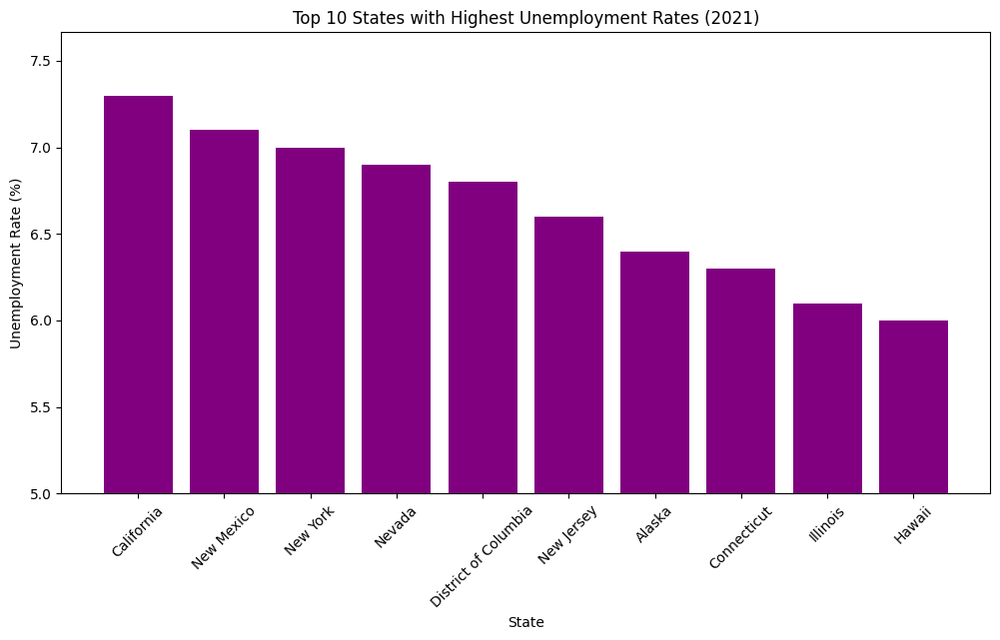

In [ ]:
import matplotlib.pyplot as plt
#Graph for states with highest unemployment rates
unemployment_data = pd.read_json('modified_unemployment.json', orient='records')

def bar_states(data):
    # only include state-level data (FIPS_Code ending in 000 indicates state-level)
    state_data = data[data['FIPS_Code'] % 1000 == 0]

    top_states = state_data.nlargest(10, 'Unemployment_rate_2021')

    # Plot the bar graph
    plt.figure(figsize=(12, 6))
    plt.bar(top_states['Area_Name'], top_states['Unemployment_rate_2021'], color='purple')
    plt.title('Top 10 States with Highest Unemployment Rates (2021)')
    plt.xlabel('State')
    plt.ylabel('Unemployment Rate (%)')
    plt.xticks(rotation=45)  # Rotate x-axis labels by 45 degrees
    plt.ylim(5, )

bar_states(unemployment_data)


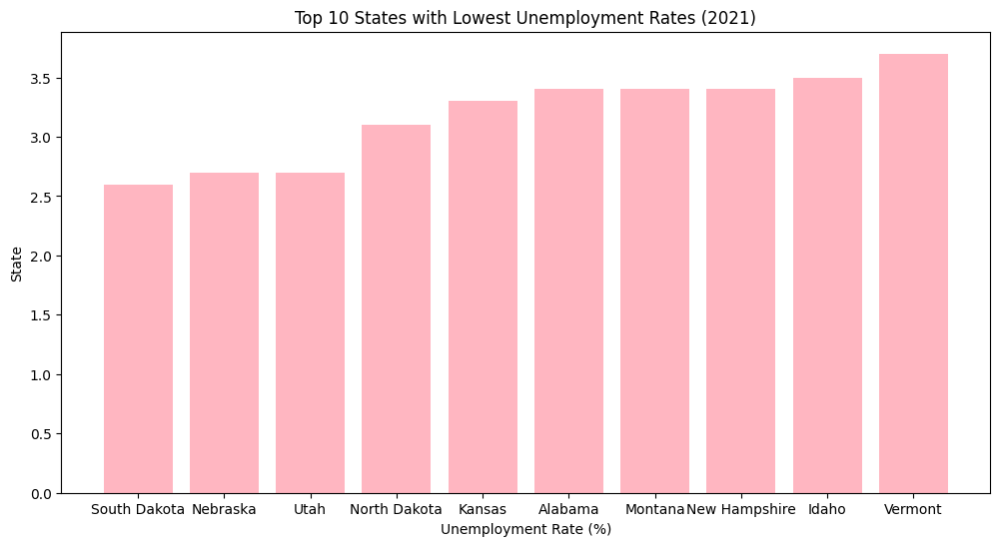

In [ ]:
#Graph states with lowest employment rate
unemployment_data = pd.read_json('modified_unemployment.json', orient='records')

def bar_states(data):
    state_data = data[data['FIPS_Code'] % 1000 == 0]

    top_states = state_data.nsmallest(10, 'Unemployment_rate_2021')

    plt.figure(figsize=(12, 6))
    plt.bar(top_states['Area_Name'], top_states['Unemployment_rate_2021'], color='lightpink')
    plt.title('Top 10 States with Lowest Unemployment Rates (2021)')
    plt.xlabel('Unemployment Rate (%)')
    plt.ylabel('State')
    plt.show()

bar_states(unemployment_data)

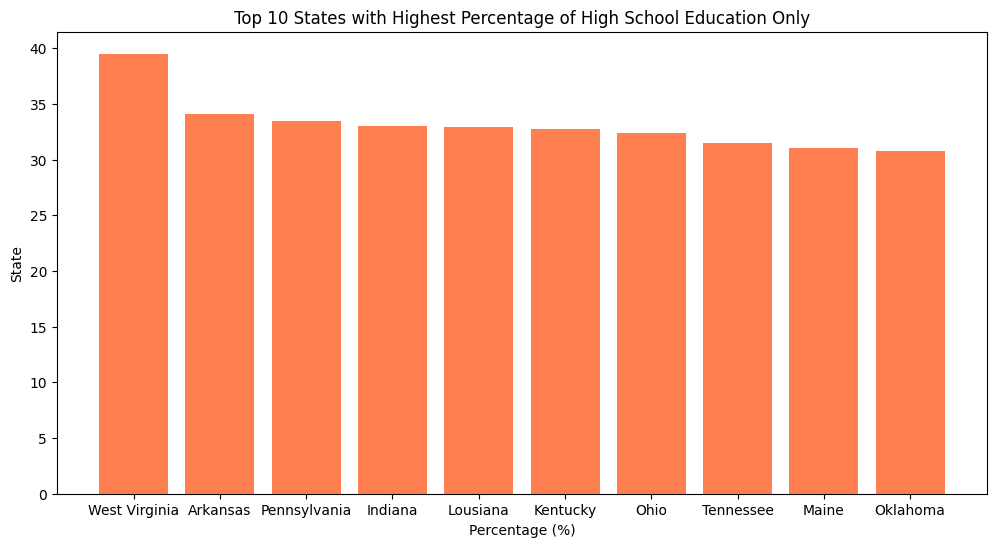

In [ ]:
#Graph states with highest percent of only high school education holders
education_data = pd.read_json('modified_education.json', orient='records')

def bar_states(data):

    state_data = data[data['State'] != "US"]
    state_data = state_data[state_data['FIPS_Code'] % 1000 == 0]

    top_states = state_data.nlargest(10, 'Percent_high_school_only')

    plt.figure(figsize=(12, 6))
    plt.bar(top_states['Area_name'], top_states['Percent_high_school_only'], color='coral')
    plt.title('Top 10 States with Highest Percentage of High School Education Only')
    plt.xlabel('Percentage (%)')
    plt.ylabel('State')
    plt.show()

bar_states(education_data)



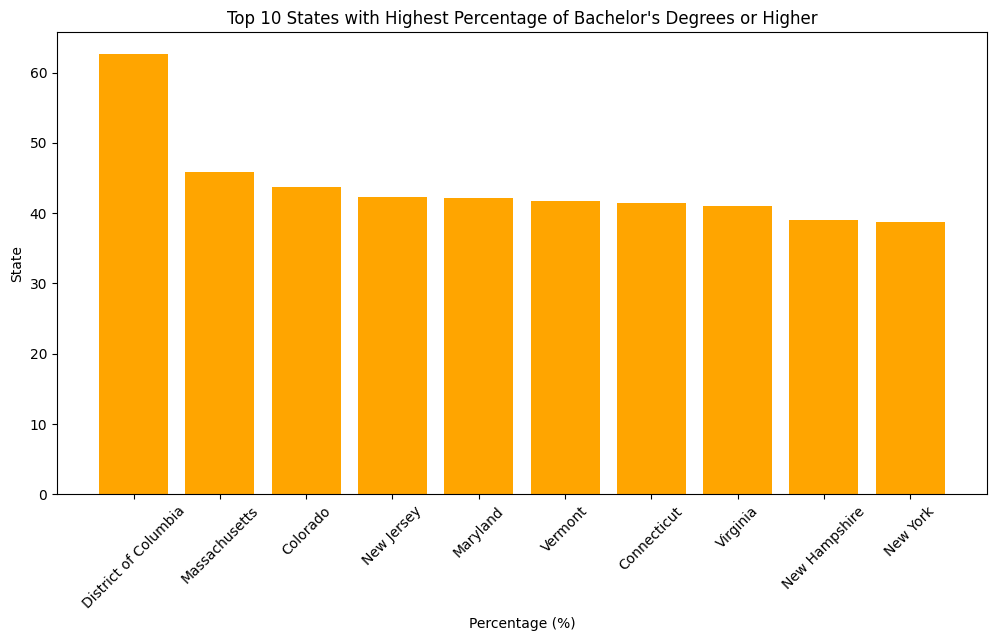

In [ ]:
#Graph the states with the highest percent of people obtaining a bachelors degree or higher
education_data = pd.read_json('modified_education.json', orient='records')

def bar_bachelors(data):
    state_data = data[data['FIPS_Code'] % 1000 == 0]

    top_states = state_data.nlargest(10, 'Percent_bachelors_or_higher')

    plt.figure(figsize=(12, 6))
    plt.bar(top_states['Area_name'], top_states['Percent_bachelors_or_higher'], color='orange')
    plt.title('Top 10 States with Highest Percentage of Bachelor\'s Degrees or Higher')
    plt.xlabel('Percentage (%)')
    plt.ylabel('State')
    plt.xticks(rotation=45)  # Rotate x-axis labels by 45 degrees
    plt.show()

bar_bachelors(education_data)


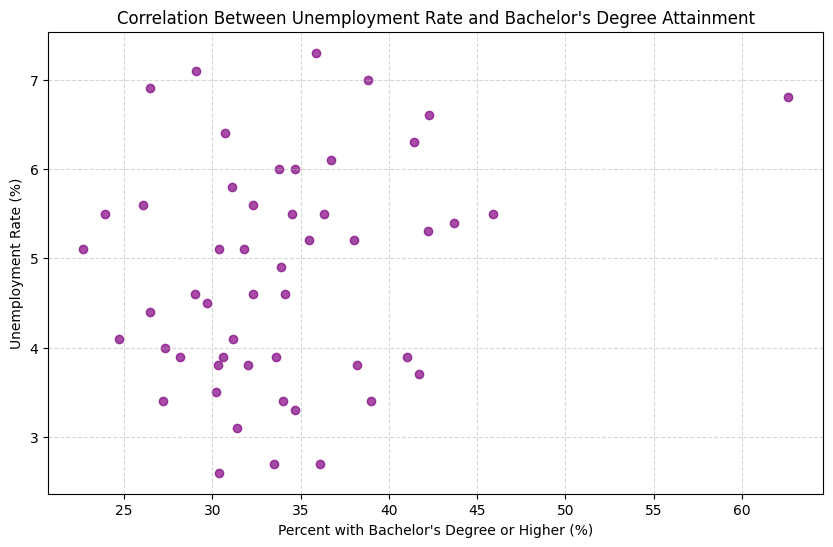

In [ ]:
#Correlation between unemployment rate and bachelor degree education
education_data = pd.read_json('modified_education.json', orient='records')
unemployment_data = pd.read_json('modified_unemployment.json', orient='records')

def scatter_unemployment_education(education_data, unemployment_data):
    education_state_data = education_data[education_data['FIPS_Code'] % 1000 == 0]
    unemployment_state_data = unemployment_data[unemployment_data['FIPS_Code'] % 1000 == 0]

    # Merge the two datasets on state
    merged_data = pd.merge(education_state_data, unemployment_state_data, on='State', how='inner')
    # 'how' is set to 'inner' to keep only matching states in both datasets

    unemployment = merged_data['Unemployment_rate_2021']
    education = merged_data['Percent_bachelors_or_higher']

    # Plot the scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(education, unemployment, color='purple', alpha=0.7)
    plt.title('Correlation Between Unemployment Rate and Bachelor\'s Degree Attainment')
    plt.xlabel('Percent with Bachelor\'s Degree or Higher (%)')
    plt.ylabel('Unemployment Rate (%)')
    plt.grid(alpha=0.5, linestyle='--')
    plt.show()

scatter_unemployment_education(education_data, unemployment_data)


Database created!
Cursor created!


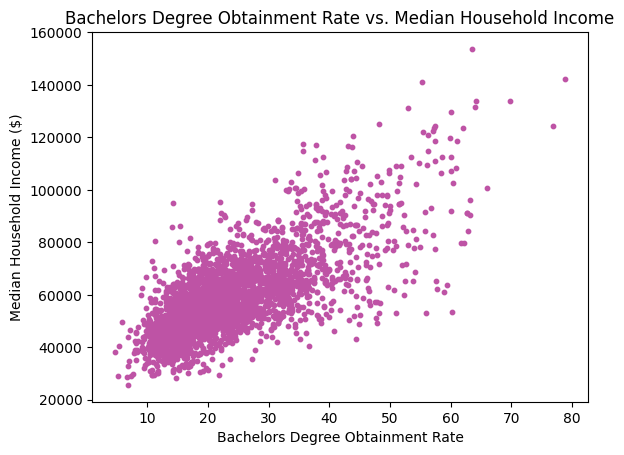

cursor closed.


In [ ]:
import sqlite3

#connect to database
connection = sqlite3.connect('avw2at.db')
# Check if the connection was successful
print("Database created!")

# Create a cursor object
cursor = connection.cursor()

# Explanation
print("Cursor created!")
cursor.close()


#4. SQL queries
cursor = connection.cursor()
#Retrieve all students' names and their grades

# Perform a JOIN query between students and grades
cursor.execute('''
SELECT unemployment.Area_Name, unemployment.Median_Household_Income_2021, education.FIPS_Code, Education.Percent_high_school_only, Education.Percent_bachelors_or_higher
FROM unemployment
JOIN education ON unemployment.FIPS_Code = education.FIPS_Code
''')

# Fetch and display the results
joined_data = cursor.fetchall()


# Define column names
columns = ["Area_Name", "Median_Household_Income_2021", "FIPS_Code",
           "Percent_high_school_only", "Percent_bachelors_or_higher"]

# Convert to a Pandas DataFrame
df = pd.DataFrame(joined_data, columns=columns)
#Convert numeric columns to numeric

df["Median_Household_Income_2021"] = df["Median_Household_Income_2021"].replace(",", "", regex=True).astype(float)
df["Percent_bachelors_or_higher"] = df["Percent_bachelors_or_higher"].astype(float)

df.head()

# Create the scatter plot
plt.scatter( df["Percent_bachelors_or_higher"],df["Median_Household_Income_2021"], s=10, c = '#be53a5')
plt.title('Bachelors Degree Obtainment Rate vs. Median Household Income')
plt.xlabel('Bachelors Degree Obtainment Rate')
plt.ylabel('Median Household Income ($)')
plt.show()

cursor.close()
print('cursor closed.')

In [ ]:
!pip install plotly-geo==1.0.0
!pip install geopandas==0.8.1
!pip install pyshp==2.1.2
!pip install shapely==1.7.1

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 962.8/962.8 kB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 63.1 MB/s eta 0:00:00
  Attempting uninstall: geopandas
    Found existing installation: geopandas 1.0.1
    Uninstalling geopandas-1.0.1:
      Successfully uninstalled geopandas-1.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 1.27.0 requires geopandas>=0.12.2, but you have geopandas 0.8.1 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 217.9/217.9 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyshp: filename=pyshp-2.1.2-py3-none-any.whl size=36263 sha256=b570b2f99128709fc050e554a53cfbcd36ee6a31

In [ ]:
# creating a fips county map

import plotly.express as px
df_educ = pd.read_csv('modified_education.csv') # import data
df_educ['FIPS_Code'] = df_educ['FIPS_Code'].astype(str).str.zfill(5) # make sure its a string, not numeric
df_educ['Percent_bachelors_or_higher'] = (
    df_educ['Percent_bachelors_or_higher'].replace(',', '', regex=True).astype(float)
)
# import geojson files
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

counties["features"][0]

fig = px.choropleth(df_educ, geojson=counties, locations='FIPS_Code', color='Percent_bachelors_or_higher',
                           color_continuous_scale="Magma",
                           range_color=(0, 75), # no place has 100% rate
                           scope="usa",
                           labels={'Percent_bachelors_or_higher':'Higher Ed Attainment Rate'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


In [ ]:
df_unemp = pd.read_csv('modified_unemployment.csv') # import data
df_unemp.head()

,FIPS_Code,State,Area_Name,Unemployed_2021,Unemployment_rate_2021,Median_Household_Income_2021,Med_HH_Income_Percent_of_State_Total_2021
0,1000,AL,Alabama,"76,019",3.4,"53,990",100.0
1,1001,AL,"Autauga County, AL",736,2.8,"66,444",123.1
2,1003,AL,"Baldwin County, AL","2,919",2.9,"65,658",121.6
3,1005,AL,"Barbour County, AL",459,5.5,"38,649",71.6
4,1007,AL,"Bibb County, AL",294,3.4,"48,454",89.7


In [ ]:
df_unemp = pd.read_csv('modified_unemployment.csv') # import data
df_unemp['FIPS_Code'] = df_unemp['FIPS_Code'].astype(str).str.zfill(5) # make sure its a string, not numeric
df_unemp['Median_Household_Income_2021'] = (
    df_unemp['Median_Household_Income_2021'].replace(',', '', regex=True).astype(float) # get rid of commas
)
df_unemp['Unemployment_rate_2021'] = (
    df_unemp['Unemployment_rate_2021'].replace(',', '', regex=True).astype(float) # get rid of commas
)



fig = px.choropleth(df_unemp, geojson=counties, locations='FIPS_Code', color='Unemployment_rate_2021',
                           color_continuous_scale="Magma",
                           range_color=(0, 12), # no place has 100% rate
                           scope="usa",
                           labels={'Unemployment_rate_2021':'2021 Unemployment Rate'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
df_educva = df_educ[df_educ['State'] == 'VA']

# just Virginia
fig = px.choropleth(
    df_educva,
    geojson=counties,
    locations='FIPS_Code',
    color='Percent_bachelors_or_higher',
    color_continuous_scale="Magma",
    range_color=(0, 75),
    scope="usa",
    labels={'Percent_bachelors_or_higher':'Higher Ed Attainment Rate'}
)



# Zoom in on Virginia
fig.update_geos(
    fitbounds="locations",  # Fit map to data
    visible=False  # Hide other states
)



fig.update_layout(
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    title="Bachelors Degree Attainment Rate in Virginia (2021)"
)

fig.show()

In [ ]:
df_va = df_unemp[df_unemp['State'] == 'VA']

# just Virginia
fig = px.choropleth(
    df_va,
    geojson=counties,
    locations='FIPS_Code',
    color='Unemployment_rate_2021',
    color_continuous_scale="Magma",
    range_color=(0, 12),
    scope="usa",
    labels={'Unemployment_rate_2021': '2021 Unemployment Rate'}
)



# Zoom in on Virginia
fig.update_geos(
    fitbounds="locations",  # Fit map to data
    visible=False  # Hide other states
)



fig.update_layout(
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    title="Unemployment Rate in Virginia (2021)"
)

fig.show()

In [ ]:
#Cloud Storage and Documentation

Written Explanation:

In order to properly store the data in Google Cloud, the project needed to be initialized to “ds2002”. After this initialization, the datasets could be created where they were named corresponding to their names “education_dataset” and “unemployment_dataset” along with the region set at Northern Virginia. For each of these datasets, tables were created by first downloading the modified_unemployment.json and modified_education.json files created from the ETL Pipeline where the schema was set to “Auto-Detect” in order to automatically determine the format of the values in the dataset. Finally, the table is named Education and Unemployment for simplicity purposes and the tables are created. After the tables are created, data analysis can now be conducted using SQL queries to find relevant information such as states with the highest unemployment rates etc. In terms of access control, principals are added as editors for group members and for everyone else it is set to the viewer permissions.


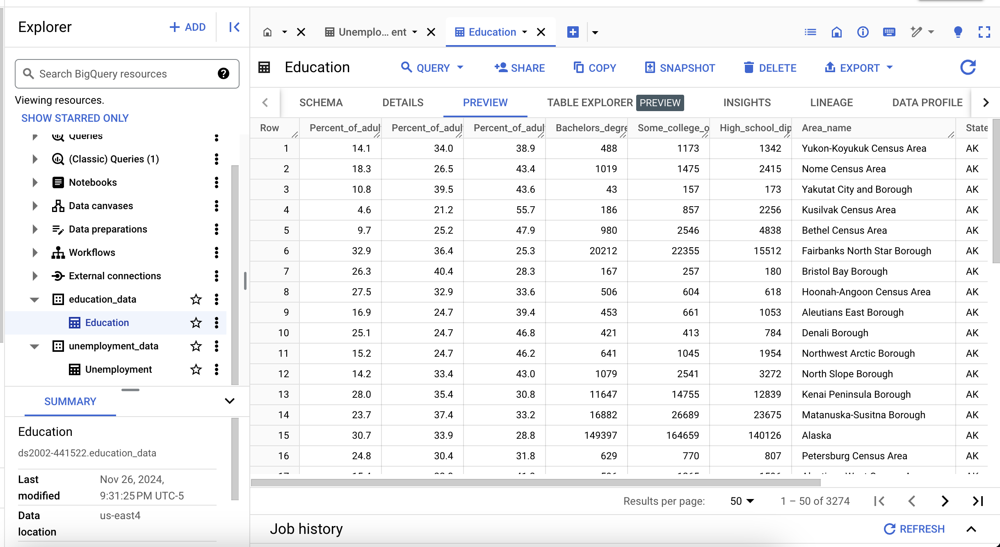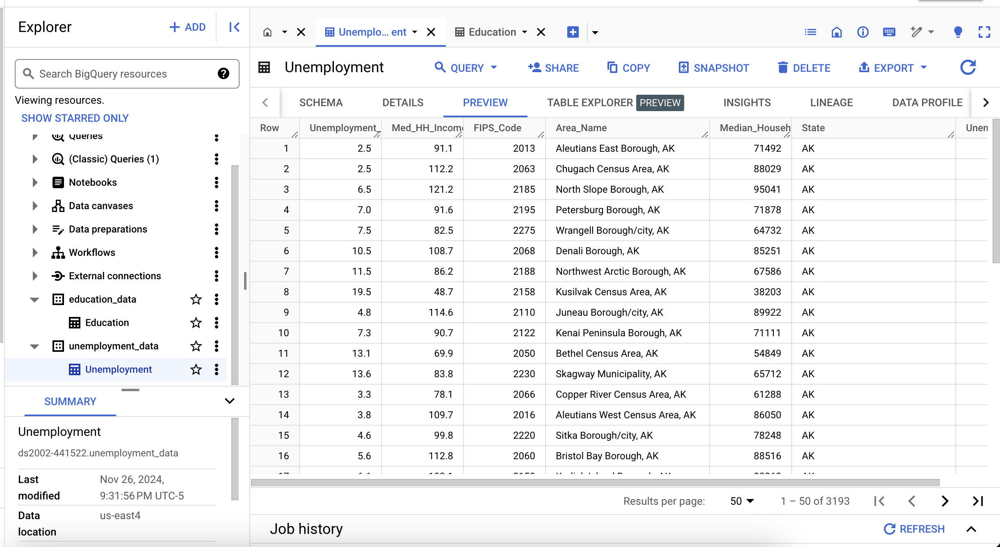

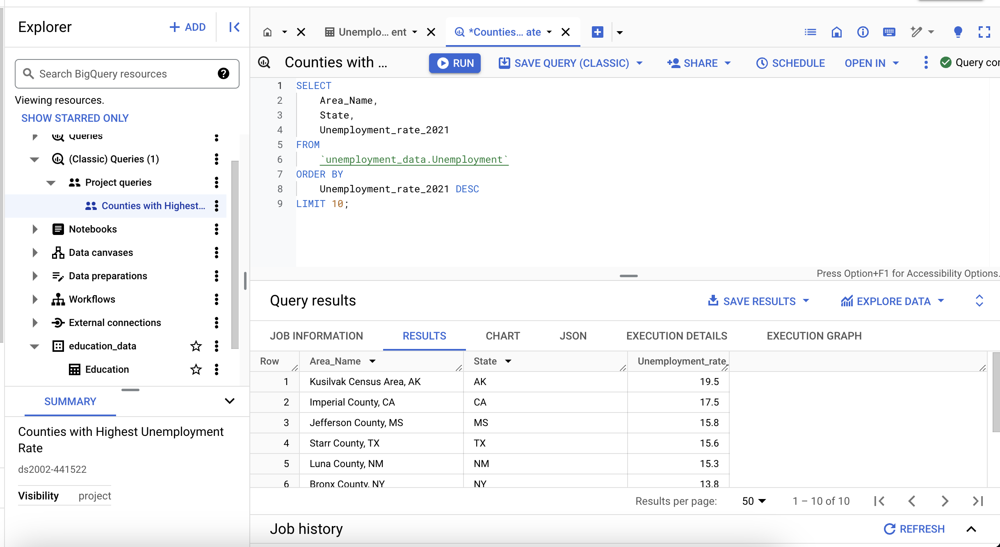